In [6]:
# install dependencies
!pip install -U torch torchvision cython
!pip install -U 'git+https://github.com/facebookresearch/fvcore.git' 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
torch.__version__

Requirement already up-to-date: torch in /usr/local/lib/python3.7/dist-packages (1.8.1+cu101)
Requirement already up-to-date: torchvision in /usr/local/lib/python3.7/dist-packages (0.9.1+cu101)
Requirement already up-to-date: cython in /usr/local/lib/python3.7/dist-packages (0.29.23)
  Cloning https://github.com/facebookresearch/fvcore.git to /tmp/pip-req-build-z_3anfdt
  Running command git clone -q https://github.com/facebookresearch/fvcore.git /tmp/pip-req-build-z_3anfdt
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-cit4aa3x
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-cit4aa3x
     |████████████████████████████████| 645kB 9.6MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5-cp37-none-any.whl size=64231 sha256=be615b252f0a118b20b1d307eee6358e3969f37146a0ed416b8f14c03c8bec81
  Stored in directory: /tmp/pip-ephem-wheel-cache-ztj5mnfb/wheels/48/53/79/3c6485543a4455a0006f5db590ab9957622b6227011941de06
  C

'1.8.1+cu101'

In [7]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

Cloning into 'detectron2_repo'...
remote: Enumerating objects: 12230, done.
remote: Counting objects: 100% (137/137), done.
remote: Compressing objects: 100% (87/87), done.
remote: Total 12230 (delta 59), reused 117 (delta 50), pack-reused 12093
Receiving objects: 100% (12230/12230), 4.85 MiB | 10.67 MiB/s, done.
Resolving deltas: 100% (8896/8896), done.
Obtaining file:///content/detectron2_repo
     |████████████████████████████████| 81kB 6.0MB/s 
     |████████████████████████████████| 153kB 46.1MB/s 
     |████████████████████████████████| 133kB 56.7MB/s 
     |████████████████████████████████| 112kB 57.1MB/s 
     |████████████████████████████████| 727kB 48.5MB/s 
     |████████████████████████████████| 747kB 52.7MB/s 
  Created wheel for pycocotools: filename=pycocotools-2.0.2-cp37-cp37m-linux_x86_64.whl size=263982 sha256=b2750ef5b56c94b3f3a2191f34fbe06a6c72f80198a82b96deb23632df8825b7
  Stored in directory: /root/.cache/pip/wheels/68/a5/e7/56401832f23d0b2db351c5b682e466cb4841960

In [1]:
#

# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
from detectron2.config import get_cfg

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

import time
import progressbar
from time import sleep
from collections import deque
from detectron2.utils.visualizer import ColorMode
from detectron2.utils.visualizer import GenericMask
import imutils

--2021-05-25 16:38:38--  https://basketball-ml.s3-eu-west-1.amazonaws.com/3DVideoFrame.jpg
Resolving basketball-ml.s3-eu-west-1.amazonaws.com (basketball-ml.s3-eu-west-1.amazonaws.com)... 52.218.29.144
Connecting to basketball-ml.s3-eu-west-1.amazonaws.com (basketball-ml.s3-eu-west-1.amazonaws.com)|52.218.29.144|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 407122 (398K) [image/jpeg]
Saving to: ‘input.jpg’

input.jpg           100%[===================>] 397.58K   548KB/s    in 0.7s    

2021-05-25 16:38:39 (548 KB/s) - ‘input.jpg’ saved [407122/407122]



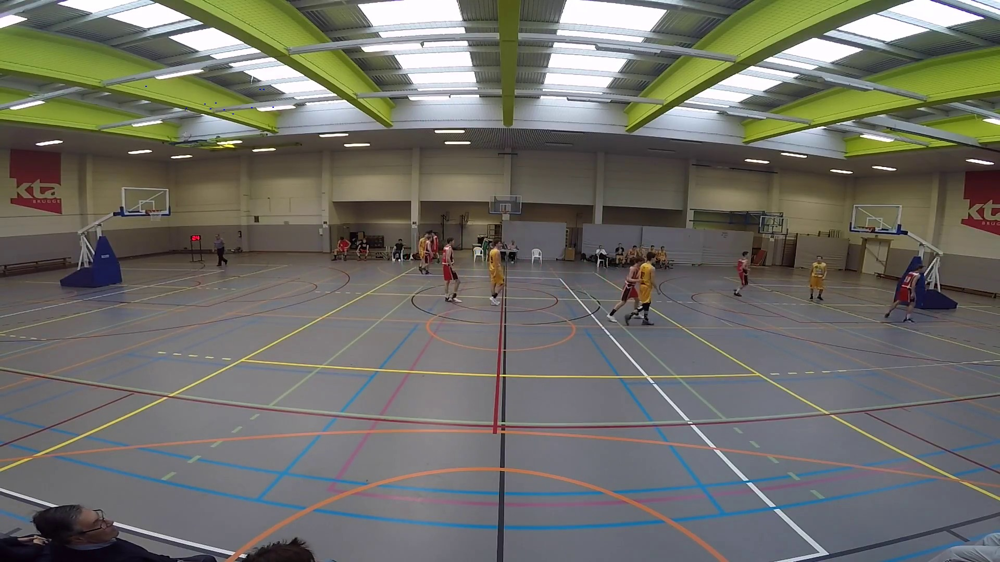

In [2]:
!wget https://basketball-ml.s3-eu-west-1.amazonaws.com/3DVideoFrame.jpg -O input.jpg
im = cv2.imread("./input.jpg")
cv2_imshow(im)

In [4]:
cfg = get_cfg()

cfg.merge_from_file("./detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model

cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"

predictor = DefaultPredictor(cfg)

players_output = predictor(im)

The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


In [5]:
# look at the outputs. See https://detectron2.readthedocs.io/tutorials/models.html#model-output-format for specification
instances = players_output["instances"]
print(instances)
pred_boxes = instances.get("pred_boxes")
pred_classes = instances.get("pred_classes")
print(pred_boxes)
print(pred_classes)

Instances(num_instances=18, image_height=1080, image_width=1920, fields=[pred_boxes: Boxes(tensor([[1691.1670,  491.0646, 1774.2107,  625.7698],
        [1551.4001,  489.3119, 1589.1509,  580.2905],
        [ 410.5745,  448.9445,  438.1576,  514.3323],
        [ 848.3120,  455.4601,  887.3537,  583.2953],
        [1212.9077,  486.4650, 1261.3945,  625.0479],
        [1167.3625,  486.0524, 1233.7257,  622.1201],
        [ 935.2166,  457.1879,  968.3894,  588.0883],
        [1414.5183,  484.9811, 1439.9838,  553.9537],
        [ 802.6909,  446.2445,  831.7790,  529.7112],
        [ 976.4870,  461.5529,  996.0903,  507.0569],
        [ 648.0588,  454.6503,  670.8181,  501.3006],
        [ 756.1771,  457.3989,  775.2789,  504.2424],
        [1635.8901,  393.1061, 1734.6709,  453.7671],
        [1262.4457,  472.3784, 1281.6125,  514.7479],
        [ 685.2921,  454.6056,  708.4387,  499.7886],
        [1240.8990,  469.8128, 1262.7472,  502.6960],
        [ 828.2458,  448.3445,  844.8597,  50

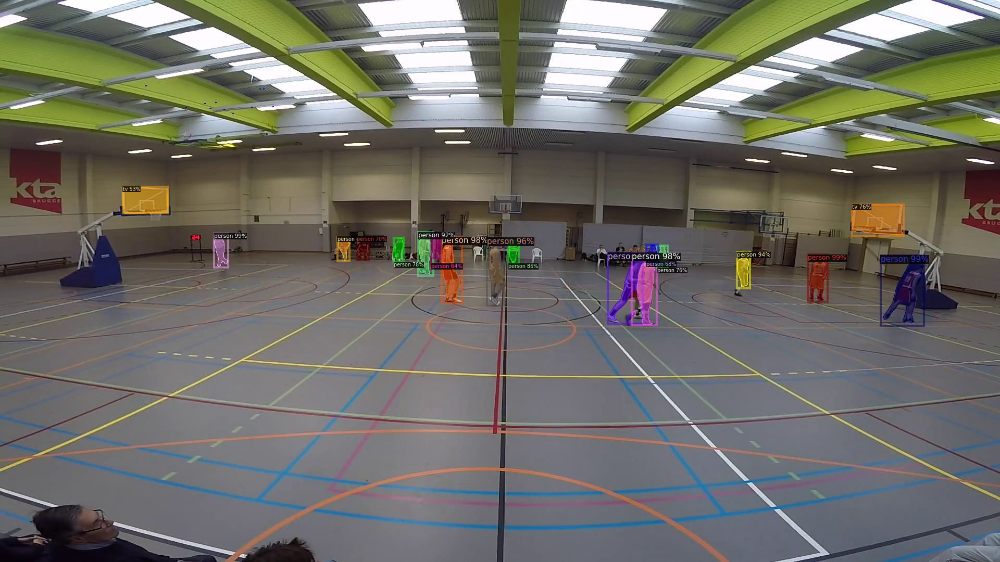

In [6]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.0)
v = v.draw_instance_predictions(players_output["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

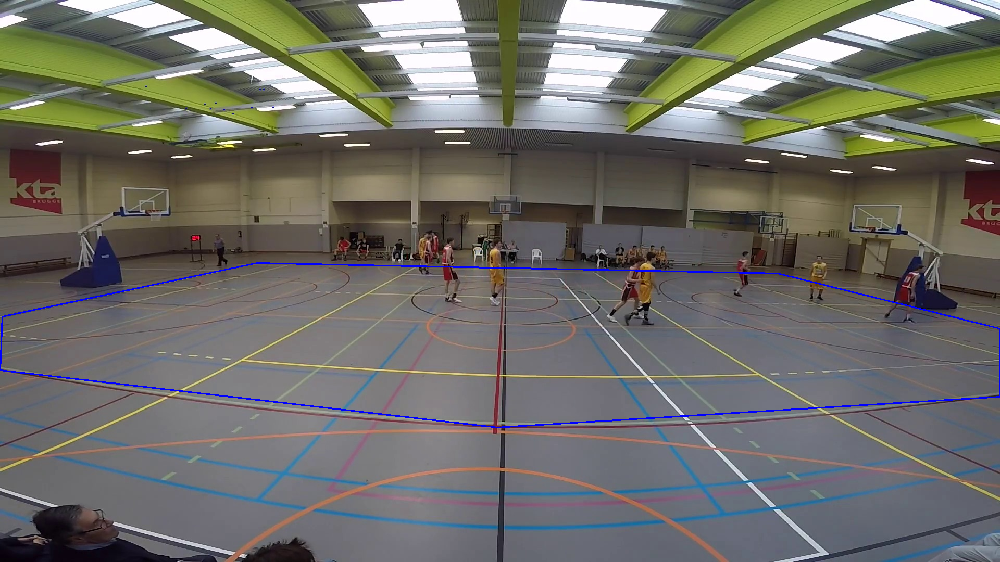

In [7]:
# Four corners of the 3D court 
# Start top-left corner and go anti-clock wise
src_pts = np.array([
        [0,711],
        [954,821],
        [1919,762],
        [1919,631],
        [1493,525],
        [493,505],
        [4,608]
    ])   

im_poly = im.copy()

# cv2.fillPoly(img_src, [src_pts], 255)
cv2.polylines(im_poly, [src_pts], isClosed=True, color=[255,0,0], thickness=2)

cv2_imshow(im_poly)

[ 1732,  625]
[ 1570,  580]
[ 867,  583]
[ 1236,  625]
[ 1200,  622]
[ 951,  588]
[ 1426,  553]
[ 816,  529]


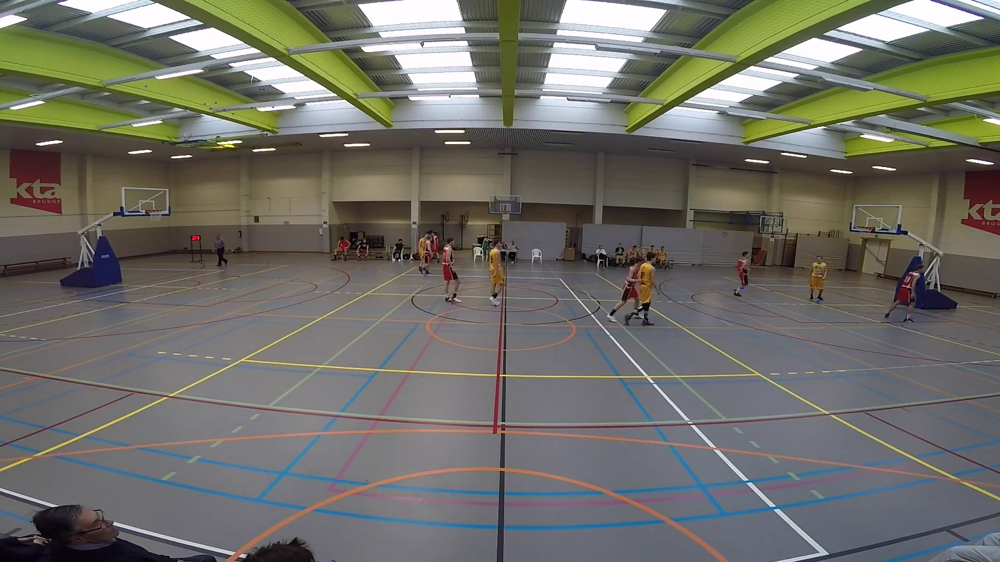

In [8]:
# Use the boxes info from the tensor prediction result
#
# x1,y1 ------
# |          |
# |          |
# |          |
# --------x2,y2
#
from shapely.geometry import Point, Polygon

def drawPlayers(im, pred_boxes, showResult=False):
  color = [255, 0, 0]   
  thickness = 1
  radius = 1

  i  = 0
  for box in pred_boxes:
    
    # Include only class Person
    if pred_classes[i] == 0:  
        
      x1 = int(box[0])
      y1 = int(box[1])
      x2 = int(box[2])
      y2 = int(box[3])

      xc = x1 + int((x2 - x1)/2)
      player_pos1 = (xc - 1, y2)
      player_pos2 = (xc + 1, y2 + 1)

      court = Polygon(src_pts)

      # Draw only players that are within the basketball court
      if Point(player_pos1).within(court):
        if showResult:
          print("[% 3d, % 3d]" %(xc, y2))

        cv2.rectangle(im, player_pos1, player_pos2, color, thickness)
        i = i + 1            

  if showResult:
    cv2_imshow(im)


drawPlayers(im, pred_boxes, True)

In [9]:
!wget https://basketball-ml.s3-eu-west-1.amazonaws.com/2DCourt1920x1080.jpg -O court.jpg

--2021-05-25 16:39:09--  https://basketball-ml.s3-eu-west-1.amazonaws.com/2DCourt1920x1080.jpg
Resolving basketball-ml.s3-eu-west-1.amazonaws.com (basketball-ml.s3-eu-west-1.amazonaws.com)... 52.218.30.104
Connecting to basketball-ml.s3-eu-west-1.amazonaws.com (basketball-ml.s3-eu-west-1.amazonaws.com)|52.218.30.104|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 141081 (138K) [image/jpeg]
Saving to: ‘court.jpg’

court.jpg           100%[===================>] 137.77K   318KB/s    in 0.4s    

2021-05-25 16:39:10 (318 KB/s) - ‘court.jpg’ saved [141081/141081]



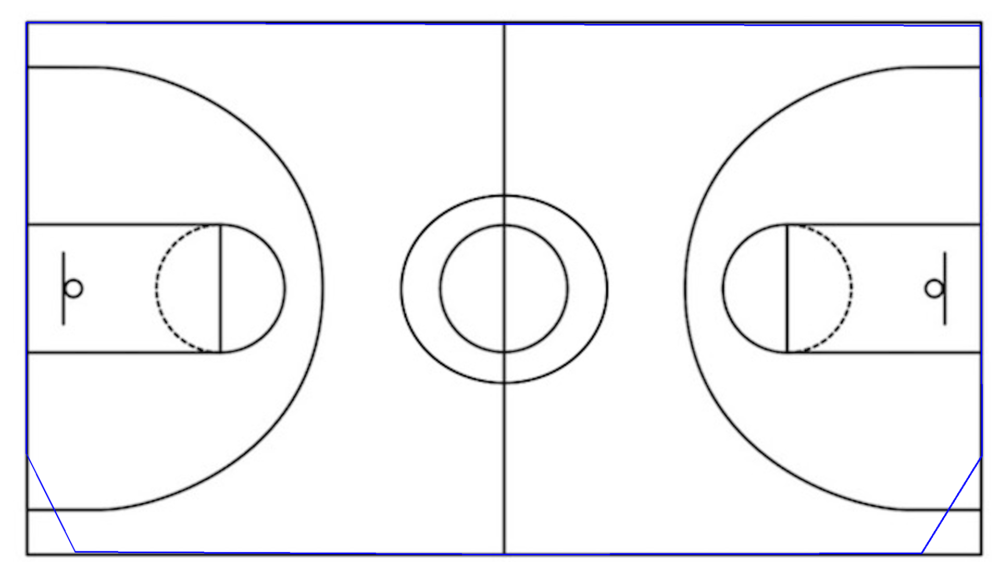

In [10]:
img_dst = cv2.imread('./court.jpg')

# Four corners of the court + mid-court circle point in destination image 
# Start top-left corner and go anti-clock wise + mid-court circle point
dst_pts = np.array([
      [144,  1060],  # LEFT BOTTOM
      [969,  1065],  # MIDDLE BOTTOM
      [1769, 1063],  # RIGHT BOTTOM
      [1885, 875],   # TOP BOTTOM RIGHT  (4 o'clock)
      [1882,  49],   # TOP RIGHT
      [50,    43],   # TOP LEFT
      [50,    871]   # TOP - BOTTOM LEFT (7 o'clock)
    ])   

cv2.polylines(img_dst, [dst_pts], isClosed=True, color=[255,0,0], thickness=2)
cv2_imshow(img_dst)

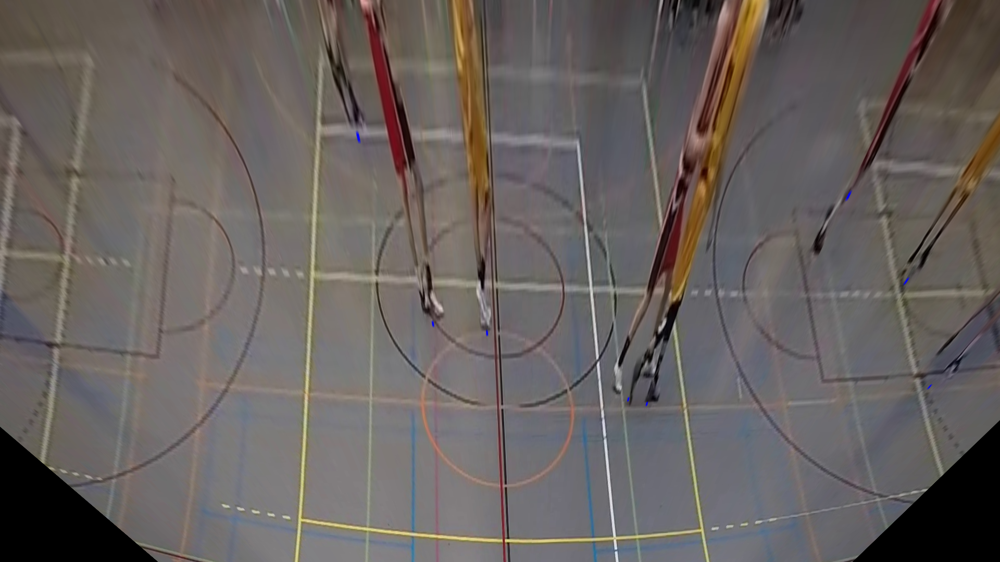

In [11]:
def homographyTransform(im, showResult=False):

  # Calculate Homography
  h, status = cv2.findHomography(src_pts, dst_pts)
  img_out = cv2.warpPerspective(im, h, (img_dst.shape[1], img_dst.shape[0]))
  
  if showResult:
    cv2_imshow(img_out)

  return img_out  

# Try out
img_out = homographyTransform(im, True)

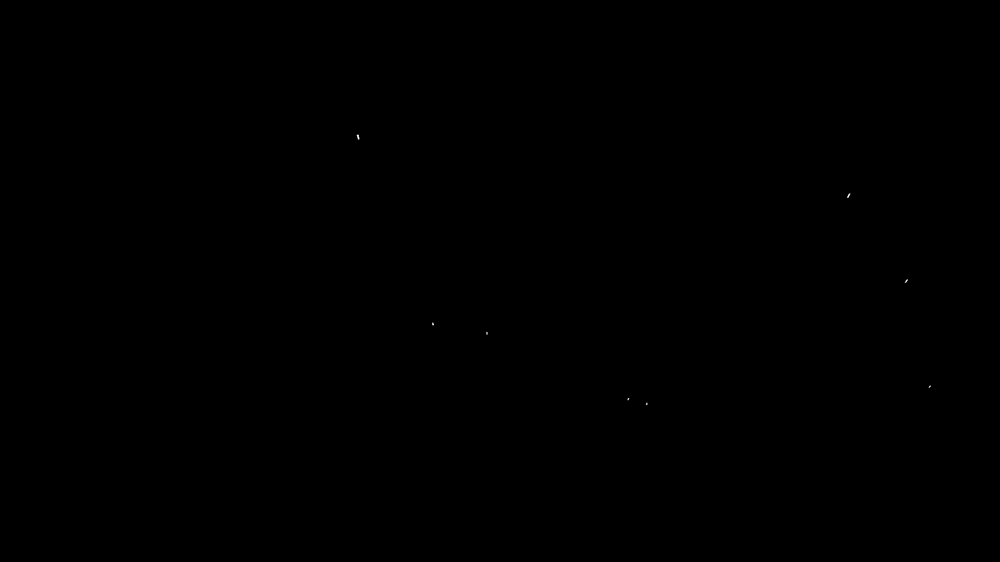

In [12]:
def getPlayersMask(im):
  lower_range = np.array([255,0,0])                         # Set the Lower range value of blue in BGR
  upper_range = np.array([255,155,155])                     # Set the Upper range value of blue in BGR
  mask = cv2.inRange(im, lower_range, upper_range)     # Create a mask with range
  result = cv2.bitwise_and(im, img_out, mask = mask)   # Performing bitwise and operation with mask in img variable
  # cv2_imshow(result)                              

  return cv2.inRange(result, lower_range, upper_range)  
  
# Try out  
mask = getPlayersMask(img_out)    
cv2_imshow(mask)

In [13]:
def drawPlayersOnCourt(im, coord, color, radius=10):
  for pos in coord:
    center_coordinates = (pos[0], pos[1])
    cv2.circle(im, center_coordinates, radius, color, thickness=-1) 

  return im

In [14]:
!wget https://basketball-ml.s3-eu-west-1.amazonaws.com/mini-map-game-input.mp4 -O video.mp4

--2021-05-25 16:39:11--  https://basketball-ml.s3-eu-west-1.amazonaws.com/mini-map-game-input.mp4
Resolving basketball-ml.s3-eu-west-1.amazonaws.com (basketball-ml.s3-eu-west-1.amazonaws.com)... 52.218.57.88
Connecting to basketball-ml.s3-eu-west-1.amazonaws.com (basketball-ml.s3-eu-west-1.amazonaws.com)|52.218.57.88|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7719881 (7.4M) [video/mp4]
Saving to: ‘video.mp4’

video.mp4           100%[===================>]   7.36M  5.77MB/s    in 1.3s    

2021-05-25 16:39:13 (5.77 MB/s) - ‘video.mp4’ saved [7719881/7719881]



In [15]:
# Draft method to draw lines between history player positions to show trail
def drawCoordinateLines(result, pts, currentFrame, player):
  
  for i in np.arange(1, len(pts)):
    
    # if either of the tracked points are None, ignore them
    if pts[i - 1] is None or pts[i] is None:
      continue

    thickness = int(np.sqrt(30 / float(i + 1)) * 2.5)
    print("player=%s" %player)
    x1 = pts[i - 1][0][0]
    x2 = pts[i - 1][0][1]
    print("x1=%d, x2=%d" %(x1, x2))
    y1 = pts[i][0][0]
    y2 = pts[i][0][1]
    print("y1=%d, y2=%d" %(y1, y2))
    print(" ---------------------- ")
    cv2.line(result, (x1, x2), (y1, y2), red_color, thickness)

  return result

In [16]:
vs = cv2.VideoCapture("./minimapa_input.mp4")
totalFrames = int(vs.get(cv2.CAP_PROP_FRAME_COUNT))

grabbed = True
currentFrame = 0
start = time.time()
writer = None

bar = progressbar.ProgressBar(maxval=totalFrames, \
      widgets=[progressbar.Bar('=', '[', ']'), ' ', progressbar.Percentage()])

bar.start()

court_img = cv2.imread('./court.jpg')

blue_color = (255,0,0)
red_color = (0,0,255)

# loop over frames from the video file stream (207)
while grabbed:     
  
  # read the next frame from the file
  (grabbed, frame) = vs.read()

  if writer is None:
    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    writer = cv2.VideoWriter("minimapa_output.mp4", fourcc, 24, (court_img.shape[1], court_img.shape[0]), True)

  if grabbed:
    # print(currentFrame)
  
    # Get player positions
    outputs = predictor(frame)  
    instances = outputs["instances"].to("cpu")
    boxes = instances.get("pred_boxes")

    court = court_img.copy()

    # Draw players on video frame
    drawPlayers(frame, boxes, False)
    
    img_out = homographyTransform(frame, False)
    # cv2_imshow(img_out)

    mask = getPlayersMask(img_out)
    
    # cv2_imshow(mask)

    # Get the contours from the players "dots" so we can reduce the coordinates
    # to the number of players on the court.
    cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
  
    if cnts is not None:      
      for cnt in cnts:
        result = drawPlayersOnCourt(court, cnt[0], blue_color)
                               
    writer.write(result)

    currentFrame += 1
    bar.update(currentFrame)
  
  else:
      grabbed = False

# cv2_imshow(result)
    
writer.release()
vs.release()
bar.finish()

end = time.time()
elap = (end - start)
print("[INFO] process took {:.4f} seconds".format(elap))

print("Video created")

[========================================================================] 100%


[INFO] process took 158.2110 seconds
Video created
